<a href="https://www.kaggle.com/code/klyushnik/s5-e9-rmse-blend-26-58413?scriptVersionId=260078716" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s5e9/sample_submission.csv
/kaggle/input/playground-series-s5e9/train.csv
/kaggle/input/playground-series-s5e9/test.csv


![fpsyg-05-01111-g002.jpg](https://www.frontiersin.org/files/Articles/97624/fpsyg-05-01111-HTML/image_m/fpsyg-05-01111-g002.jpg)

# Welcome!

**Welcome to my code! Here I will present my vision and solution for the dataset "Predicting the Beats-per-Minute of Songs," where the primary metric is Root Mean Squared Error.**

**Enjoy watching, and please vote!**

**My GitHub: https://github.com/Alexsandrrus!**

# Imports

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
from matplotlib.pyplot import figure

import numpy as np
import pandas as pd
from scipy import stats
from scipy.optimize import minimize
from scipy.stats import mstats
from scipy.stats.mstats import winsorize

from sklearn import preprocessing
from sklearn.preprocessing import (
    LabelEncoder,
    QuantileTransformer,
    StandardScaler,
    PowerTransformer,
    MaxAbsScaler,
    MinMaxScaler,
    RobustScaler,
    PolynomialFeatures,
    OrdinalEncoder,
    OneHotEncoder,
    FunctionTransformer,
    KBinsDiscretizer,
)
from sklearn.feature_selection import (
    VarianceThreshold,
    SelectKBest,
    f_regression,
    SequentialFeatureSelector,
    SelectFromModel
)
from sklearn.model_selection import (
    StratifiedKFold,
    KFold,
    StratifiedGroupKFold,
    RepeatedStratifiedKFold,
    RepeatedKFold,
    cross_validate,
    train_test_split,
    TimeSeriesSplit,
    cross_val_score
)
from sklearn.linear_model import (
    SGDOneClassSVM,
    LinearRegression,
    Ridge,
    Lasso,
    ElasticNet,
)
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import (
    HistGradientBoostingRegressor,
    ExtraTreesRegressor,
    GradientBoostingRegressor,
    IsolationForest,
    BaggingRegressor,
    RandomForestRegressor,
    AdaBoostRegressor
)
from sklearn.decomposition import PCA
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error, 
    r2_score,
    make_scorer
)
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin

import tensorflow as tf
from tensorflow.keras.models import clone_model
import keras
from keras_tuner import RandomSearch
from keras import layers
from keras.layers import (
    BatchNormalization,
    Flatten,
    Dense,
    Dropout,
    Activation,
)
from tensorflow.keras.models import Sequential
from keras import backend as K
import keras_tuner
from keras_tuner import Hyperband
from functools import partial

import optuna
from optuna.samplers import CmaEsSampler
from optuna.pruners import MedianPruner
import optuna.visualization as vis

from catboost import CatBoostRegressor
import xgboost as xgb
from lightgbm import LGBMRegressor
from mlxtend.regressor import StackingRegressor, StackingCVRegressor
from category_encoders import TargetEncoder, MEstimateEncoder
#from cuml.preprocessing import TargetEncoder

import requests
import holidays
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing

from category_encoders import CatBoostEncoder, LeaveOneOutEncoder

import warnings
import re
import time
import logging
from functools import partial
from itertools import combinations
from IPython.display import Image

from functools import partial

# Visualization settings
plt.style.use('ggplot')
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12, 8)
sns.set_context("notebook", font_scale=1.2)
sns.set_style("whitegrid")

# Pandas settings
pd.options.mode.chained_assignment = None

# Logging configuration
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Warnings configuration
warnings.filterwarnings('ignore')

2025-09-05 05:14:57.728713: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757049297.948513      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757049298.016759      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Setting

In [3]:
def plot_numerical_features(df):
    num_features = df.select_dtypes(include=[np.number]).columns
    ncols = 2
    nrows = (len(num_features) + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 6 * nrows))
    axes = axes.flatten()

    for i, feature in enumerate(num_features):
        sns.histplot(df[feature], bins=30, kde=True, ax=axes[i], color='skyblue', edgecolor='black')
        axes[i].set_title(f'Distribution of {feature}', fontsize=18, fontweight='bold')
        axes[i].set_xlabel(feature, fontsize=14)
        axes[i].set_ylabel('Frequency', fontsize=14)
        axes[i].grid(True, linestyle='--', alpha=0.7)  

        mean_value = df[feature].mean()
        axes[i].axvline(mean_value, color='red', linestyle='--', label='Mean')
        axes[i].legend()

    plt.tight_layout()
    plt.show()

def plot_numerical_boxplots(df):
    num_features = df.select_dtypes(include=[np.number]).columns
    ncols = 2
    nrows = (len(num_features) + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 6 * nrows))
    axes = axes.flatten()

    for i, feature in enumerate(num_features):
        sns.boxplot(x=df[feature], ax=axes[i], color='lightgreen')
        axes[i].set_title(f'Boxplot of {feature}', fontsize=18, fontweight='bold')
        axes[i].set_xlabel(feature, fontsize=14)
        axes[i].grid(True, linestyle='--', alpha=0.7)  

        median_value = df[feature].median()
        axes[i].axvline(median_value, color='orange', linestyle='--', label='Median')
        axes[i].legend()

    plt.tight_layout()
    plt.show()

def plot_qq_plot(df):
    num_features = df.select_dtypes(include=[np.number]).columns
    ncols = 2
    nrows = (len(num_features) + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 6 * nrows))
    axes = axes.flatten()

    for i, feature in enumerate(num_features):
        stats.probplot(df[feature], dist="norm", plot=axes[i])
        axes[i].set_title(f'QQ Plot of {feature}', fontsize=18, fontweight='bold')
        axes[i].set_xlabel('Theoretical Quantiles', fontsize=14)
        axes[i].set_ylabel('Sample Quantiles', fontsize=14)
        axes[i].grid(True, linestyle='--', alpha= 0.7)  

    plt.tight_layout()
    plt.show()

def plot_correlation_matrix(df, method='spearman'):
    num_df = df.select_dtypes(include=[np.number])
    
    corr = num_df.corr(method=method)
    plt.figure(figsize=(14, 10))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8}, linewidths=.5)
    plt.title(f'Correlation Matrix ({method.capitalize()} Correlation)', fontsize=18, fontweight='bold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

def plot_pairplot(df):
    num_features = df.select_dtypes(include=[np.number]).columns
    sns.pairplot(df[num_features], diag_kind='kde', plot_kws={'alpha': 0.6, 'edgecolor': 'k'}, height=2.5)
    plt.suptitle('Pairplot of Numerical Features', y=1.02, fontsize=18, fontweight='bold')
    plt.show()

def plot_categorical_features(df, ncols=2, top_n=None):
    cat_features = df.select_dtypes(include=[object]).columns
    nrows = (len(cat_features) + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 6 * nrows))
    axes = axes.flatten()

    for i, feature in enumerate(cat_features):
        if top_n is not None:
            top_categories = df[feature].value_counts().nlargest(top_n).index
            sns.countplot(data=df[df[feature].isin(top_categories)], y=feature, ax=axes[i], palette='viridis', order=top_categories)
        else:
            sns.countplot(data=df, y=feature, ax=axes[i], palette='viridis')
        
        axes[i].set_title(f'Count of {feature}', fontsize=18, fontweight='bold')
        axes[i].set_xlabel('Count', fontsize=14)
        axes[i].set_ylabel(feature, fontsize=14)
        axes[i].tick_params(axis='y', rotation=0)
        axes[i].grid(True, linestyle='--', alpha=0.7)  
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

def PolynomialFeatures_labeled(input_df,power):
   
    poly = preprocessing.PolynomialFeatures(power)
    output_nparray = poly.fit_transform(input_df)
    powers_nparray = poly.powers_

    input_feature_names = list(input_df.columns)
    target_feature_names = ["Constant Term"]
    for feature_distillation in powers_nparray[1:]:
        intermediary_label = ""
        final_label = ""
        for i in range(len(input_feature_names)):
            if feature_distillation[i] == 0:
                continue
            else:
                variable = input_feature_names[i]
                power = feature_distillation[i]
                intermediary_label = "%s+%d" % (variable,power)
                if final_label == "":         #If the final label isn't yet specified
                    final_label = intermediary_label
                else:
                    final_label = final_label + "x" + intermediary_label
        target_feature_names.append(final_label)
    output_df = pd.DataFrame(output_nparray, columns = target_feature_names)
    return output_df

def variance_threshold(df,th):
    var_thres=VarianceThreshold(threshold=th)
    var_thres.fit(df)
    new_cols = var_thres.get_support()
    return df.iloc[:,new_cols]
   
def optimize_memory_usage(df, print_size=True):
    """
    Optimizes memory usage in a DataFrame by downcasting numeric columns.

    Parameters:
        df (pd.DataFrame): The DataFrame to optimize.
        print_size (bool): If True, prints memory usage before and after optimization.

    Returns:
        pd.DataFrame: The optimized DataFrame.
    """
    # Types for optimization.
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    
    # Memory usage size before optimize (Mb).
    before_size = df.memory_usage().sum() / 1024**2
    
    for column in df.columns:
        column_type = df[column].dtype
        
        if column_type in numerics:
            try:
                if str(column_type).startswith('int'):
                    df[column] = pd.to_numeric(df[column], downcast='integer')
                else:
                    df[column] = pd.to_numeric(df[column], downcast='float')
                logger.info(f"Optimized column {column}: {column_type} -> {df[column].dtype}")
            except Exception as e:
                logger.error(f"Failed to optimize column {column}: {e}")
    
    # Memory usage size after optimize (Mb).
    after_size = df.memory_usage().sum() / 1024**2
    
    if print_size:
        print(
            'Memory usage size: before {:5.4f} Mb - after {:5.4f} Mb ({:.1f}%).'.format(
                before_size, after_size, 100 * (before_size - after_size) / before_size
            )
        )
    
    return df

def categorize_variable(df, column, labels):
    
    if len(labels) != 3:
        raise ValueError("3 type")
    
    bins = [-float('inf'), 
            df[column].quantile(0.25), 
            df[column].quantile(0.75), 
            float('inf')]
    
    df[f'{column}_group'] = pd.cut(df[column], bins=bins, labels=labels)
    return df

def replace_outliers_with_mean(df, threshold=3):

    df_clean = df.copy()
    
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    
    for col in numeric_cols:
        
        z_scores = np.abs(stats.zscore(df[col], nan_policy='omit')) 
        
        mean_val = df[col][z_scores <= threshold].mean()
        
        df_clean[col] = np.where(z_scores > threshold, mean_val, df[col])
        
    return df_clean

# Data & info

In [4]:
train = pd.read_csv('/kaggle/input/playground-series-s5e9/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s5e9/test.csv')

display(train.shape, test.shape)
display(train.info(), test.info())

test = test.drop(['id'], axis =1)
train = train.drop(['id'], axis =1)

display(train.describe().T)
display(test.describe().T)

duplicates = train.duplicated()
print(f"Number of duplicates: {duplicates.sum()}")

duplicates = test.duplicated()
print(f"Number of duplicates: {duplicates.sum()}")

for col in train.columns:
    pct_missing = np.mean(train[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

display(train.head(5))

(524164, 11)

(174722, 10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 524164 entries, 0 to 524163
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   id                         524164 non-null  int64  
 1   RhythmScore                524164 non-null  float64
 2   AudioLoudness              524164 non-null  float64
 3   VocalContent               524164 non-null  float64
 4   AcousticQuality            524164 non-null  float64
 5   InstrumentalScore          524164 non-null  float64
 6   LivePerformanceLikelihood  524164 non-null  float64
 7   MoodScore                  524164 non-null  float64
 8   TrackDurationMs            524164 non-null  float64
 9   Energy                     524164 non-null  float64
 10  BeatsPerMinute             524164 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 44.0 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174722 entries, 0 to 174721
Data columns (tota

None

None

,count,mean,std,min,25%,50%,75%,max
RhythmScore,524164.0,0.632843,0.156899,0.076900,0.515850,0.634686,0.739179,0.975000
AudioLoudness,524164.0,-8.379014,4.616221,-27.509725,-11.551933,-8.252499,-4.912298,-1.357000
VocalContent,524164.0,0.074443,0.049939,0.023500,0.023500,0.066425,0.107343,0.256401
AcousticQuality,524164.0,0.262913,0.223120,0.000005,0.069413,0.242502,0.396957,0.995000
InstrumentalScore,524164.0,0.117690,0.131845,0.000001,0.000001,0.074247,0.204065,0.869258
LivePerformanceLikelihood,524164.0,0.178398,0.118186,0.024300,0.077637,0.166327,0.268946,0.599924
MoodScore,524164.0,0.555843,0.225480,0.025600,0.403921,0.564817,0.716633,0.978000
TrackDurationMs,524164.0,241903.692949,59326.601501,63973.000000,207099.876625,243684.058150,281851.658500,464723.228100
Energy,524164.0,0.500923,0.289952,0.000067,0.254933,0.511800,0.746000,1.000000
BeatsPerMinute,524164.0,119.034899,26.468077,46.718000,101.070410,118.747660,136.686590,206.037000


,count,mean,std,min,25%,50%,75%,max
RhythmScore,174722.0,0.632591,0.157229,0.140859,0.514918,0.634556,0.739179,0.975000
AudioLoudness,174722.0,-8.377495,4.622288,-27.442731,-11.550095,-8.253186,-4.903740,-1.357000
VocalContent,174722.0,0.074475,0.050024,0.023500,0.023500,0.066432,0.107302,0.258857
AcousticQuality,174722.0,0.262903,0.222899,0.000005,0.069448,0.242412,0.396870,0.995000
InstrumentalScore,174722.0,0.117407,0.131628,0.000001,0.000001,0.073968,0.202977,0.680914
LivePerformanceLikelihood,174722.0,0.178317,0.118165,0.024300,0.077821,0.165956,0.268133,0.599544
MoodScore,174722.0,0.555861,0.226218,0.025600,0.403788,0.566015,0.716694,0.978000
TrackDurationMs,174722.0,241753.736419,59103.896616,63973.000000,207518.151300,243584.585400,281737.445300,449288.808400
Energy,174722.0,0.500545,0.290550,0.000067,0.253817,0.511867,0.746133,0.999867


Number of duplicates: 0
Number of duplicates: 0
RhythmScore - 0%
AudioLoudness - 0%
VocalContent - 0%
AcousticQuality - 0%
InstrumentalScore - 0%
LivePerformanceLikelihood - 0%
MoodScore - 0%
TrackDurationMs - 0%
Energy - 0%
BeatsPerMinute - 0%


,RhythmScore,AudioLoudness,VocalContent,AcousticQuality,InstrumentalScore,LivePerformanceLikelihood,MoodScore,TrackDurationMs,Energy,BeatsPerMinute
0,0.603610,-7.636942,0.023500,0.000005,0.000001,0.051385,0.409866,290715.6450,0.826267,147.53020
1,0.639451,-16.267598,0.071520,0.444929,0.349414,0.170522,0.651010,164519.5174,0.145400,136.15963
2,0.514538,-15.953575,0.110715,0.173699,0.453814,0.029576,0.423865,174495.5667,0.624667,55.31989
3,0.734463,-1.357000,0.052965,0.001651,0.159717,0.086366,0.278745,225567.4651,0.487467,147.91212
4,0.532968,-13.056437,0.023500,0.068687,0.000001,0.331345,0.477769,213960.6789,0.947333,89.58511


# Optimize memory

In [5]:
train = optimize_memory_usage(train)
test = optimize_memory_usage(test)

Memory usage size: before 39.9907 Mb - after 21.9949 Mb (45.0%).
Memory usage size: before 11.9973 Mb - after 6.6652 Mb (44.4%).


# Exploratory Data Analysis

## Numerical feature

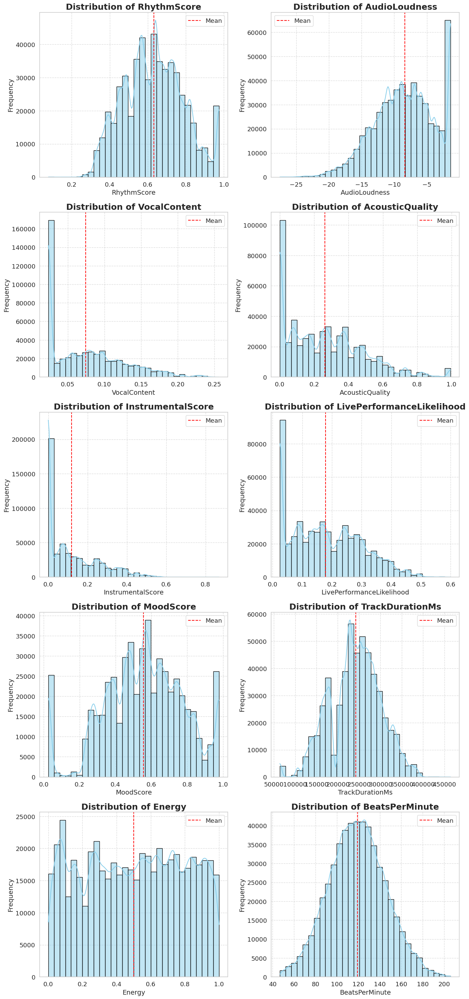

In [6]:
plot_numerical_features(train)

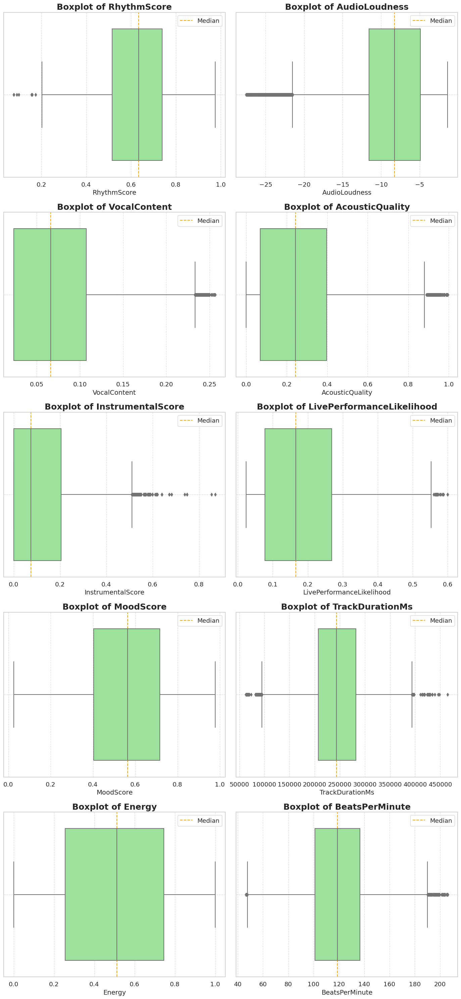

In [7]:
plot_numerical_boxplots(train)

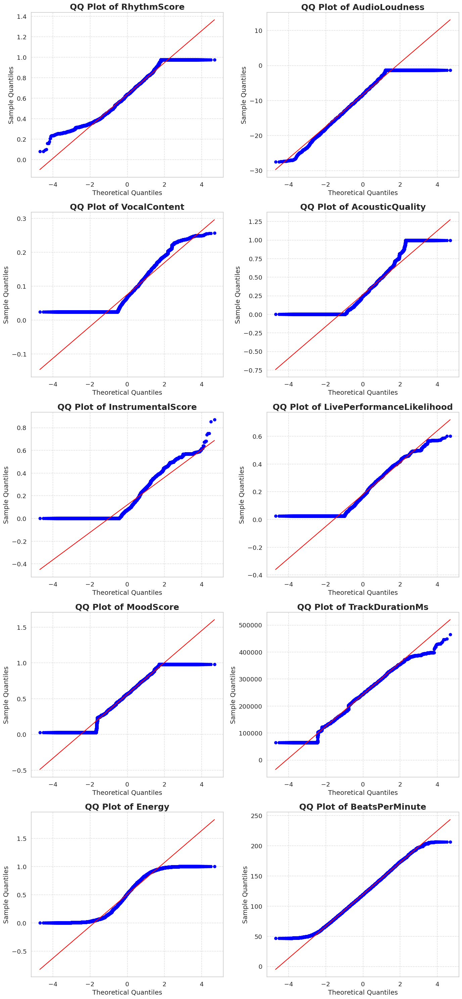

In [8]:
plot_qq_plot(train)

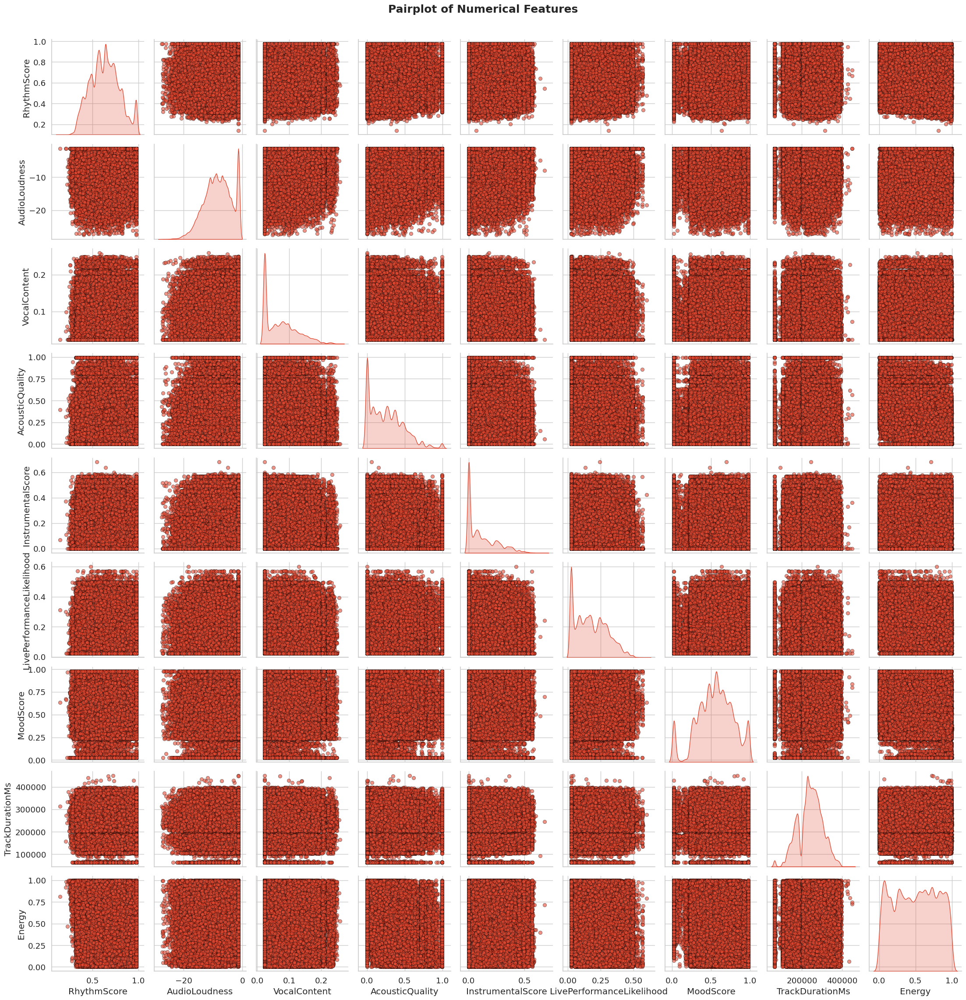

In [9]:
plot_pairplot(test)

## Correlation matrix

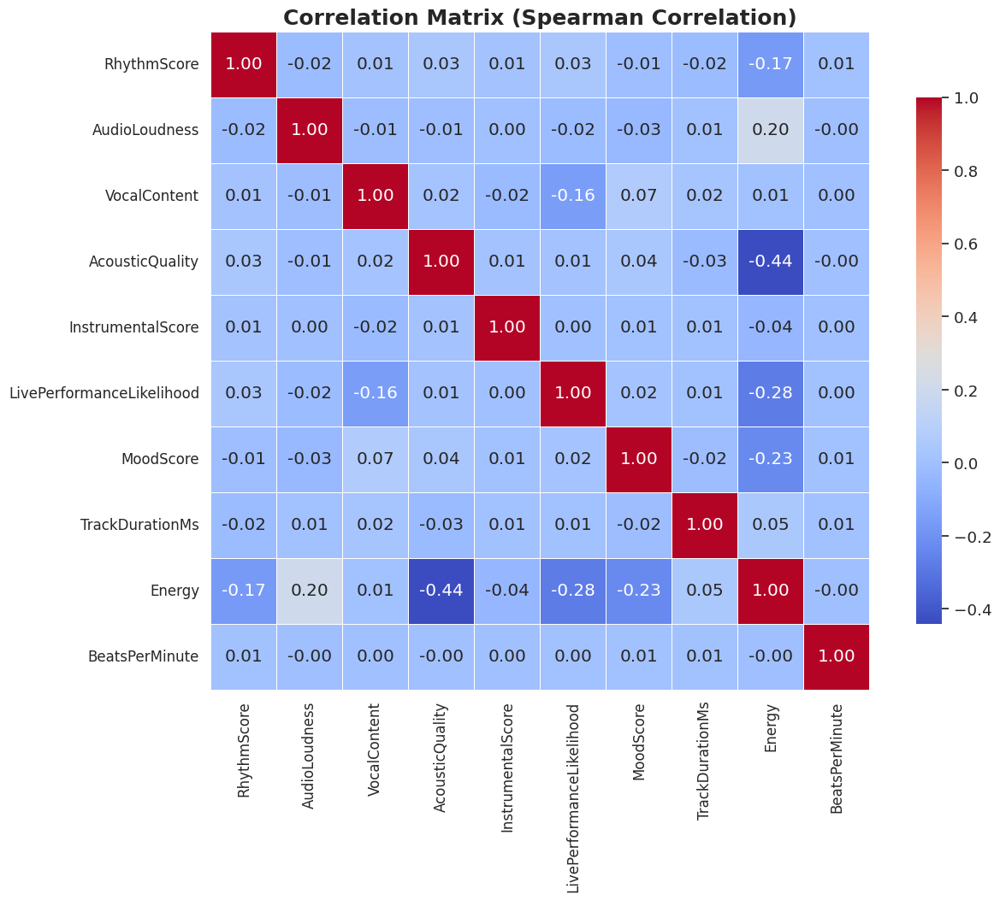

In [10]:
plot_correlation_matrix(train)

## Variance Inflation Factor

In [11]:
X = sm.add_constant(train.select_dtypes(include=[np.number]).iloc [:, 1:])

VIFs = pd.DataFrame()
VIFs['Variable'] = X.columns
VIFs['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(VIFs)

                    Variable        VIF
0                      const  69.204442
1              AudioLoudness   1.047218
2               VocalContent   1.019453
3            AcousticQuality   1.244814
4          InstrumentalScore   1.001034
5  LivePerformanceLikelihood   1.112415
6                  MoodScore   1.076432
7            TrackDurationMs   1.003320
8                     Energy   1.482937
9             BeatsPerMinute   1.000149


# New features

In [12]:
train.columns

Index(['RhythmScore', 'AudioLoudness', 'VocalContent', 'AcousticQuality',
       'InstrumentalScore', 'LivePerformanceLikelihood', 'MoodScore',
       'TrackDurationMs', 'Energy', 'BeatsPerMinute'],
      dtype='object')

In [13]:
train['LoudnessEnergy_Interaction'] = train['AudioLoudness'] * train['Energy']
train['LoudnessEnergy_Ratio'] = train['Energy'] / (-1*train['AudioLoudness'] + 1e-7)
train['EnergyPerMinute'] = train['Energy'] * (60000 / train['TrackDurationMs'])

train['VocalInstrumental_Balance'] = train['VocalContent'] / (train['InstrumentalScore'] + 1e-7)
train['VocalInstrumental_Interaction'] = train['VocalContent'] * train['InstrumentalScore']

train['AcousticnessEnergy_Interaction'] = train['AcousticQuality'] * train['Energy'] 
train['MoodEnergy_Interaction'] = train['MoodScore'] * train['Energy'] 
train['LiveEnergy_Interaction'] = train['LivePerformanceLikelihood'] * train['Energy'] 

train['RhythmStability'] = train['RhythmScore'] * train['TrackDurationMs'] 
train['RhythmEnergy_Interaction'] = train['RhythmScore'] * train['Energy']

train['Energy_Squared'] = train['Energy'] ** 2
train['Log_Duration'] = np.log1p(train['TrackDurationMs']) 
train['Log_Loudness'] = np.log1p(-1*train['AudioLoudness'])

train['LogLoudness_Energy_Interaction'] = train['Log_Loudness'] * train['Energy']
train['LogDuration_Energy_Interaction'] = train['Log_Duration'] * train['Energy']

test['LoudnessEnergy_Interaction'] = test['AudioLoudness'] * test['Energy']
test['LoudnessEnergy_Ratio'] = test['Energy'] / (-1*test['AudioLoudness'] + 1e-7)
test['EnergyPerMinute'] = test['Energy'] * (60000 / test['TrackDurationMs'])

test['VocalInstrumental_Balance'] = test['VocalContent'] / (test['InstrumentalScore'] + 1e-7)
test['VocalInstrumental_Interaction'] = test['VocalContent'] * test['InstrumentalScore']

test['AcousticnessEnergy_Interaction'] = test['AcousticQuality'] * test['Energy'] 
test['MoodEnergy_Interaction'] = test['MoodScore'] * test['Energy'] 
test['LiveEnergy_Interaction'] = test['LivePerformanceLikelihood'] * test['Energy'] 

test['RhythmStability'] = test['RhythmScore'] * test['TrackDurationMs'] 
test['RhythmEnergy_Interaction'] = test['RhythmScore'] * test['Energy']

test['Energy_Squared'] = test['Energy'] ** 2
test['Log_Duration'] = np.log1p(test['TrackDurationMs']) 
test['Log_Loudness'] = np.log1p(-1*test['AudioLoudness'])

test['LogLoudness_Energy_Interaction'] = test['Log_Loudness'] * test['Energy']
test['LogDuration_Energy_Interaction'] = test['Log_Duration'] * test['Energy']

display(train.shape, test.shape)

(524164, 25)

(174722, 24)

## Split data & threshold

In [14]:
X = train.drop(columns=['BeatsPerMinute'])
y = train['BeatsPerMinute']

#not today
X = variance_threshold(X,0.003)
list_name = (X.columns)
test = test[list_name]

display(X.shape, test.shape)

(524164, 24)

(174722, 24)

In [15]:
scaler = RobustScaler()

X[X.select_dtypes(include=[np.number]).columns] = scaler.fit_transform(X[X.select_dtypes(include=[np.number]).columns])
test[X.select_dtypes(include=[np.number]).columns] = scaler.transform(test[X.select_dtypes(include=[np.number]).columns])

X.shape, y.shape, test.shape

((524164, 24), (524164,), (174722, 24))

# Ensemble voting on feature importance

In [16]:
# def feature_selection_ensemble(X, y, n_features_to_select=20, random_state=42):
    
#     models = [
#         RandomForestRegressor(n_estimators=200, random_state=random_state, n_jobs=-1),
#         ExtraTreesRegressor(n_estimators=200, random_state=random_state, n_jobs=-1),
#         xgb.XGBRegressor(n_estimators=200, random_state=random_state, n_jobs=-1),
#         LGBMRegressor(n_estimators=200, random_state=random_state, n_jobs=-1)
#     ]
    
#     feature_importances = pd.DataFrame(index=X.columns)
    
#     for i, model in enumerate(models):
#         print(f"Training {model.__class__.__name__} for feature importance...")
#         model.fit(X, y)
        
#         if hasattr(model, 'feature_importances_'):
#             importances = model.feature_importances_
#         elif hasattr(model, 'coef_'):
#             importances = np.abs(model.coef_)
#         else:
#             continue
            
#         feature_importances[f'model_{i}'] = importances
    
#     feature_importances_normalized = feature_importances.div(feature_importances.sum(axis=0), axis=1)
    
#     feature_importances['mean_importance'] = feature_importances_normalized.mean(axis=1)
#     feature_importances['rank'] = feature_importances['mean_importance'].rank(ascending=False)
    
#     feature_importances = feature_importances.sort_values('mean_importance', ascending=False)
    
#     selected_features = feature_importances.head(n_features_to_select).index.tolist()
    
#     print(f"\nSelected top {n_features_to_select} features:")
#     for i, (feature, importance) in enumerate(zip(selected_features, 
#                                                 feature_importances['mean_importance'].head(n_features_to_select)), 1):
#         print(f"{i:2d}. {feature}: {importance:.6f}")
    
#     return selected_features, feature_importances

In [ ]:
# selected_features, feature_importance_df = feature_selection_ensemble(
#         X, y, n_features_to_select=20, random_state=42
#     )
# X = X[selected_features]
# test = test[selected_features]

# plt.figure(figsize=(12, 8))
# feature_importance_df['mean_importance'].head(20).plot(kind='barh')
# plt.title('Top 20 Feature Importances')
# plt.xlabel('Importance')
# plt.tight_layout()
# plt.show()

# print(f"\nOriginal features: {len(train.columns) - 1}")
# print(f"Selected features: {len(selected_features)}")
# print(f"Reduction: {len(train.columns) - 1 - len(selected_features)} features removed")

Training RandomForestRegressor for feature importance...


# Optuna

In [ ]:
def optimize_catboost_regression(X, y, n_trials=20, cv=3):
  
    def rmse_scorer(y_true, y_pred):
        return np.sqrt(mean_squared_error(y_true, y_pred))
    
    rmse_score = make_scorer(rmse_scorer, greater_is_better=False)
    
    def objective(trial):
        params = {
            'iterations': trial.suggest_int('iterations', 100, 1000),
            'depth': trial.suggest_int('depth', 4, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
            'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
            'border_count': trial.suggest_int('border_count', 32, 255),
            'random_strength': trial.suggest_float('random_strength', 0, 2),
            'bagging_temperature': trial.suggest_float('bagging_temperature', 0, 1),
            'grow_policy': trial.suggest_categorical('grow_policy', ['SymmetricTree', 'Depthwise']),
            'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50),
            'loss_function': 'RMSE',
            'eval_metric': 'RMSE',
            # 'task_type': 'GPU', 
            'verbose': False,
            'early_stopping_rounds': 100
        }

        model = CatBoostRegressor(**params)
        
        
        scores = cross_val_score(model, X, y, cv=cv, 
                               scoring=rmse_score, n_jobs=1)
        
       
        return scores.mean()
    
    study = optuna.create_study(direction='maximize')  
    study.optimize(objective, n_trials=n_trials)
    
    return study

catboost_studies = []
for i in range(3):
    print(f"\nRunning CatBoost Regression optimization {i+1}/3")
    study = optimize_catboost_regression(X, y, n_trials=20)
    catboost_studies.append(study)
    print(f"Best trial {i+1}:")
    print(f"  Value (-RMSE): {study.best_value:.5f}")
    print(f"  Actual RMSE: {-study.best_value:.5f}")  
    print(f"  Params: {study.best_params}")


catboost_rmse_params = []

for i, study in enumerate(catboost_studies):
    params = study.best_params.copy()
    params['loss_function'] = 'RMSE'
    params['eval_metric'] = 'RMSE'
    params['verbose'] = False
    catboost_rmse_params.append(params)
    print(f"\nBest parameters for model {i+1}:")
    for key, value in params.items():
        print(f"  {key}: {value}")


print("\n" + "="*50)
print("OPTIMIZATION SUMMARY")
print("="*50)
for i, (study, params) in enumerate(zip(catboost_studies, catboost_rmse_params)):
    print(f"Model {i+1}: RMSE = {-study.best_value:.5f}")

parameters = { 
               'iterations': 357,
                'depth': 4,
              'learning_rate': 0.019293830422619496,
              'l2_leaf_reg': 1.7030277055187715,
              'border_count': 68,
              'random_strength': 0.6543682482313615,
              'bagging_temperature': 0.9769334546523897,
              'grow_policy': 'SymmetricTree',
              'min_data_in_leaf': 15,
              'loss_function': 'RMSE',
              'eval_metric': 'RMSE',
              'verbose': False,
}


parameters_2 = {
                  'iterations': 270,
                  'depth': 6,
                  'learning_rate': 0.02773583289422086,
                  'l2_leaf_reg': 5.453251706129398,
                  'border_count': 145,
                  'random_strength': 0.3971144579660211,
                  'bagging_temperature': 0.6160360201200582,
                  'grow_policy': 'SymmetricTree',
                  'min_data_in_leaf': 4,
                  'loss_function': 'RMSE',
                  'eval_metric': 'RMSE',
                  'verbose': False
}

parameters_3 = {
                  'iterations': 455,
                  'depth': 6,
                  'learning_rate': 0.011395973420244683,
                  'l2_leaf_reg': 4.358597404490118,
                  'border_count': 229,
                  'random_strength': 0.428844179505764,
                  'bagging_temperature': 0.12315921245762332,
                  'grow_policy': 'SymmetricTree',
                  'min_data_in_leaf': 6,
                  'loss_function': 'RMSE',
                  'eval_metric': 'RMSE',
                  'verbose': False
}

catboost_rmse_params.append(parameters)
catboost_rmse_params.append(parameters_2)
catboost_rmse_params.append(parameters_3)

In [ ]:
def optimize_xgboost_regression(X, y, n_trials=20, cv=3):
   
    def rmse_scorer(y_true, y_pred):
        return np.sqrt(mean_squared_error(y_true, y_pred))
    
    rmse_score = make_scorer(rmse_scorer, greater_is_better=False)
    
    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'gamma': trial.suggest_float('gamma', 0, 1),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 2),
            'reg_alpha': trial.suggest_float('reg_alpha', 0, 1),
            'max_delta_step': trial.suggest_int('max_delta_step', 0, 5),
            'eval_metric': 'rmse',
            'grow_policy': trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide']),
            'max_leaves': trial.suggest_int('max_leaves', 32, 256),
            'max_bin': trial.suggest_int('max_bin', 128, 256),
            # 'tree_method': 'gpu_hist',
            # 'predictor': 'gpu_predictor',
            # 'sampling_method': trial.suggest_categorical('sampling_method', ['uniform', 'gradient_based'])
        }
        
        model = xgb.XGBRegressor(**params)
        
        scores = cross_val_score(model, X, y, cv=cv, 
                               scoring=rmse_score, n_jobs=1)
        
        return scores.mean()
    
    study = optuna.create_study(direction='maximize')  
    study.optimize(objective, n_trials=n_trials)
    
    return study


xgb_studies = []
for i in range(3):
    print(f"\nRunning XGBoost Regression optimization {i+1}/3")
    study = optimize_xgboost_regression(X, y, n_trials=20)
    xgb_studies.append(study)
    print(f"Best trial {i+1}:")
    print(f"  Value (-RMSE): {study.best_value:.5f}")
    print(f"  Actual RMSE: {-study.best_value:.5f}")  
    print(f"  Params: {study.best_params}")

xgb_rmse_params = []
for i, study in enumerate(xgb_studies):
    params = study.best_params.copy()
    params.update({
        # 'tree_method': 'gpu_hist',
        # 'predictor': 'gpu_predictor',
        'eval_metric': 'rmse'
    })
    xgb_rmse_params.append(params)
    print(f"\nXGBoost config {i+1}:")
    for key, value in params.items():
        print(f"  {key}: {value}")

print("\n" + "="*50)
print("XGBOOST OPTIMIZATION SUMMARY")
print("="*50)
for i, (study, params) in enumerate(zip(xgb_studies, xgb_rmse_params)):
    print(f"Model {i+1}: RMSE = {-study.best_value:.5f}")

config_1 = {
              'n_estimators': 374,
              'max_depth': 7,
              'learning_rate': 0.0050247034923121625,
              'subsample': 0.6881223558971589,
              'colsample_bytree': 0.7869461512231557,
              'gamma': 0.828135543683264,
              'min_child_weight': 6,
              'reg_lambda': 1.667240816732193,
              'reg_alpha': 0.44092922531878276,
              'max_delta_step': 4,
              'grow_policy': 'lossguide',
              'max_leaves': 117,
              'max_bin': 147,
              'eval_metric': 'rmse'
}

config_2 = {
              'n_estimators': 136,
              'max_depth': 4,
              'learning_rate': 0.027359333604422675,
              'subsample': 0.6825248494688766,
              'colsample_bytree': 0.7955947575775649,
              'gamma': 0.9730566106537739,
              'min_child_weight': 6,
              'reg_lambda': 1.3545740379218356,
              'reg_alpha': 0.6652666597117963,
              'max_delta_step': 4,
              'grow_policy': 'depthwise',
              'max_leaves': 174,
              'max_bin': 171,
              'eval_metric': 'rmse'
}

config_3 = {
              'n_estimators': 317,
              'max_depth': 3,
              'learning_rate': 0.0105144370995476,
              'subsample': 0.8418008197832596,
              'colsample_bytree': 0.6029589209120716,
              'gamma': 0.3235479454568891,
              'min_child_weight': 10,
              'reg_lambda': 0.14522064555399145,
              'reg_alpha': 0.7113614331944631,
              'max_delta_step': 5,
              'grow_policy': 'depthwise',
              'max_leaves': 127,
              'max_bin': 256,
              'eval_metric': 'rmse'
}

xgb_rmse_params.append(config_1)
xgb_rmse_params.append(config_2)
xgb_rmse_params.append(config_3)

In [ ]:
def optimize_lightgbm_regression(X, y, n_trials=20, cv=3):
    
    def rmse_scorer(y_true, y_pred):
        return np.sqrt(mean_squared_error(y_true, y_pred))
    
    rmse_score = make_scorer(rmse_scorer, greater_is_better=False)
    
    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
            'num_leaves': trial.suggest_int('num_leaves', 20, 128),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
            'min_child_weight': trial.suggest_float('min_child_weight', 0.001, 0.1),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
            'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
            'bagging_freq': trial.suggest_int('bagging_freq', 0, 10),
            'lambda_l1': trial.suggest_float('lambda_l1', 0, 1),
            'lambda_l2': trial.suggest_float('lambda_l2', 0, 1),
            'min_split_gain': trial.suggest_float('min_split_gain', 0, 0.2),
            'path_smooth': trial.suggest_float('path_smooth', 0, 1),
            'max_bin': trial.suggest_int('max_bin', 64, 256),
            'extra_trees': trial.suggest_categorical('extra_trees', [True, False]),
            # 'device': 'gpu',
            # 'gpu_platform_id': 0,
            # 'gpu_device_id': 0,
            'objective': 'regression',
            'metric': 'rmse',
            'verbose': -1
        }
        
        model = LGBMRegressor(**params)
        
        scores = cross_val_score(model, X, y, cv=cv, 
                               scoring=rmse_score, n_jobs=1)
        
        return scores.mean()
    
    study = optuna.create_study(direction='maximize') 
    study.optimize(objective, n_trials=n_trials)
    
    return study


lgbm_studies = []
for i in range(3):
    print(f"\nRunning LightGBM Regression optimization {i+1}/3")
    study = optimize_lightgbm_regression(X, y, n_trials=20)
    lgbm_studies.append(study)
    print(f"Best trial {i+1}:")
    print(f"  Value (-RMSE): {study.best_value:.5f}")
    print(f"  Actual RMSE: {-study.best_value:.5f}")  
    print(f"  Params: {study.best_params}")


lgbm_rmse_params = []
for i, study in enumerate(lgbm_studies):
    params = study.best_params.copy()
    params.update({
        # 'device': 'gpu',
        'objective': 'regression',
        'metric': 'rmse',
        'verbose': -1
    })
    lgbm_rmse_params.append(params)
    print(f"\nLightGBM config {i+1}:")
    for key, value in params.items():
        print(f"  {key}: {value}")


print("\n" + "="*50)
print("LIGHTGBM OPTIMIZATION SUMMARY")
print("="*50)
for i, (study, params) in enumerate(zip(lgbm_studies, lgbm_rmse_params)):
    print(f"Model {i+1}: RMSE = {-study.best_value:.5f}")

# Model

In [ ]:
def create_ensemble(X, y, test, n_folds=5, use_log_transform=True):
    FOLDS = KFold(n_splits=n_folds, shuffle=True, random_state=42)
    
    if use_log_transform:
        y_transformed = np.log1p(y)
        print("Applied log1p transformation to target variable")
    else:
        y_transformed = y.copy()
    
    all_oof = {}
    all_predictions = {}
    models = []

    for i, params in enumerate(catboost_rmse_params, 1):
        models.append((f'cat_{i}', CatBoostRegressor(**params)))
    
    for i, params in enumerate(xgb_rmse_params, 1):
        models.append((f'xgb_{i}', xgb.XGBRegressor(**params, n_jobs=1)))
    
    for i, params in enumerate(lgbm_rmse_params, 1):
        models.append((f'lgb_{i}', LGBMRegressor(**params, n_jobs=1)))
    
    for name, model in models:
        try:
            print(f"\nTraining {name}...")
            oof = np.zeros(len(X))
            pred = np.zeros(len(test))
            
            for fold, (trn_idx, val_idx) in enumerate(FOLDS.split(X, y_transformed)):
                X_train, y_train = X.iloc[trn_idx], y_transformed.iloc[trn_idx]
                X_val, y_val = X.iloc[val_idx], y_transformed.iloc[val_idx]
                
                model.fit(X_train, y_train)
                oof[val_idx] = model.predict(X_val)
                pred += model.predict(test) / FOLDS.n_splits
                
                if use_log_transform:
                    fold_rmse = np.sqrt(mean_squared_error(np.expm1(y_val), np.expm1(oof[val_idx])))
                else:
                    fold_rmse = np.sqrt(mean_squared_error(y_val, oof[val_idx]))
                print(f'{name} - Fold {fold} RMSE: {fold_rmse:.4f}')
            
            all_oof[name] = oof
            all_predictions[name] = pred
            
            if use_log_transform:
                full_rmse = np.sqrt(mean_squared_error(y, np.expm1(oof)))
            else:
                full_rmse = np.sqrt(mean_squared_error(y, oof))
            print(f'{name} - Full OOF RMSE: {full_rmse:.4f}')
            
        except Exception as e:
            print(f"Error training {name}: {str(e)}")
            continue
    
    oof_df = pd.DataFrame(all_oof)
    predictions_df = pd.DataFrame(all_predictions)
    
    if use_log_transform:
        oof_df['target'] = y.values
        oof_df['target_transformed'] = y_transformed.values
    else:
        oof_df['target'] = y.values
    
    model_info = {
        'model_names': [name for name, _ in models],
        'num_models': len(models),
        'features_used': list(X.columns),
        'used_log_transform': use_log_transform
    }
    
    if use_log_transform:
        for col in predictions_df.columns:
            predictions_df[col] = np.expm1(predictions_df[col])
    
    return oof_df, predictions_df, model_info

# Fit

In [ ]:
oof_results, test_predictions, model_info = create_ensemble(X, y, test)
    
oof_results.to_csv('oof_predictions.csv', index=False)
test_predictions.to_csv('test_predictions.csv', index=False)

print("\nModeling completed successfully!")
print(f"Trained {model_info['num_models']} models")
print("OOF predictions shape:", oof_results.shape)
print("Test predictions shape:", test_predictions.shape)

# Mix & blend

In [ ]:
# def create_optimal_ensemble(oof_results, test_predictions, y):
   
#     oof_predictions = oof_results.drop(['target', 'target_transformed'], axis=1, errors='ignore')
#     y_true = oof_results['target'] if 'target' in oof_results else y
    
#     ridge = Ridge(alpha=1.0)
#     ridge.fit(oof_predictions, y_true)
#     ridge_pred = ridge.predict(oof_predictions)
#     ridge_rmse = np.sqrt(mean_squared_error(y_true, ridge_pred))
    
#     def objective(weights):
#         weighted_pred = np.dot(oof_predictions.values, weights)
#         return np.sqrt(mean_squared_error(y_true, weighted_pred))
    
#     constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
#     bounds = [(0, 1)] * len(oof_predictions.columns)
#     initial_weights = np.ones(len(oof_predictions.columns)) / len(oof_predictions.columns)
    
#     result = minimize(objective, initial_weights, 
#                      method='SLSQP', bounds=bounds, constraints=constraints)
#     optimized_weights = result.x
#     optimized_pred = np.dot(oof_predictions.values, optimized_weights)
#     optimized_rmse = np.sqrt(mean_squared_error(y_true, optimized_pred))
    
#     if ridge_rmse <= optimized_rmse:
#         print(f"Using Ridge (RMSE: {ridge_rmse:.4f})")
#         test_pred = ridge.predict(test_predictions)
#         weights = ridge.coef_
#     else:
#         print(f"Using Optimized Weights (RMSE: {optimized_rmse:.4f})")
#         test_pred = np.dot(test_predictions.values, optimized_weights)
#         weights = optimized_weights
    
#     weights = weights / weights.sum()
    
#     return test_pred, weights, min(ridge_rmse, optimized_rmse)

In [ ]:
# test_pred, weights, best_rmse = create_optimal_ensemble(oof_results, test_predictions, y)

# print(f"\nBest Ensemble RMSE: {best_rmse:.4f}")
# print("Final weights:")
# for model, weight in zip(test_predictions.columns, weights):
#     print(f"  {model}: {weight:.4f}")

In [ ]:
oof_predictions = oof_results.drop(['target', 'target_transformed'], axis=1, errors='ignore')

ensemble_oof = oof_predictions.mean(axis=1)  

ensemble_test = test_predictions.mean(axis=1)  

rmse = np.sqrt(mean_squared_error(y, ensemble_oof))
print(f"Simple Average RMSE: {rmse:.4f}")

# Submit

In [ ]:
sample = pd.read_csv('/kaggle/input/playground-series-s5e9/sample_submission.csv')
sample['BeatsPerMinute'] = ensemble_test
sample.to_csv('submission.csv', index=False)
sample.head(10)